# ノイズ除去

**ノイズ除去（noise removal / denoising）** は、画像に混入した不要な変動成分（ノイズ）を取り除き、元の信号をできるだけ忠実に復元する処理のこと。

カメラのセンサーの熱雑音、低照度環境での量子ノイズ、伝送路でのビット誤りなど、様々な原因でノイズが発生する。ノイズ除去は画像処理パイプラインの前処理として広く使われており、後続の特徴抽出・認識精度に大きく影響する。

本節では代表的なノイズの種類と、それぞれに対して有効なフィルタリング手法を学ぶ。

## 評価指標：PSNR

ノイズ除去の効果を定量的に評価するために **PSNR（Peak Signal-to-Noise Ratio、最大信号対雑音比）** を使う。

:::{admonition} PSNR

$$
\text{PSNR} = 20 \log_{10} \frac{255}{\sqrt{\text{MSE}}}
$$

ここで MSE（Mean Squared Error）は：

$$
\text{MSE} = \frac{1}{HW} \sum_{i,j} \left( I(i,j) - \hat{I}(i,j) \right)^2
$$

- $I$：元画像（ノイズなし）
- $\hat{I}$：処理後の画像（復元画像）
- 単位は dB（デシベル）
- 値が大きいほど元画像に近い（高品質）
- 一般的に 30 dB 以上であれば視覚的に良好とされる

:::

## 1. ノイズの種類

### ガウシアンノイズ（Gaussian Noise）

最も一般的なノイズモデル。各ピクセルに平均 0・標準偏差 $\sigma$ の正規分布に従う乱数が加算される。

カメラの熱雑音・アンプのランダムノイズなどを模している。$\sigma$ が大きいほどノイズが強くなる。

:::{admonition} ガウシアンノイズモデル

$$
I_{\text{noisy}}(x, y) = I(x, y) + \eta(x, y), \quad \eta \sim \mathcal{N}(0, \sigma^2)
$$

:::

### ソルト＆ペッパーノイズ（Salt & Pepper Noise）

画像のランダムな位置に、真っ白（255）または真っ黒（0）の画素が散在するノイズ。インパルスノイズとも呼ばれる。センサーの欠陥や伝送エラーで発生する。

### スペックルノイズ（Speckle Noise）

超音波画像やレーダー画像に特有のノイズ。画素値に乗算的に加わる。

:::{admonition} スペックルノイズモデル

$$
I_{\text{noisy}}(x, y) = I(x, y) + I(x, y) \cdot \eta(x, y), \quad \eta \sim \mathcal{U}(0, \sigma)
$$

ガウシアンノイズが **加算的** であるのに対し、スペックルノイズは **乗算的** であるため、明るい領域ほどノイズも大きくなる特性がある。

:::

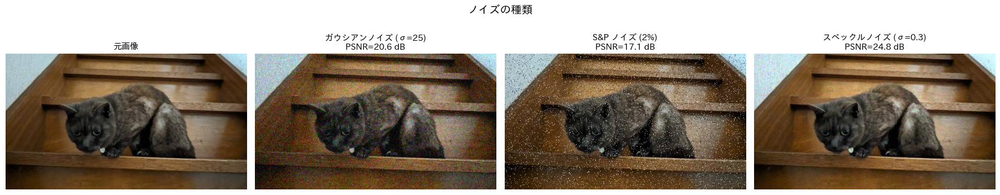

In [24]:
import cv2
import numpy as np
import matplotlib_fontja
import matplotlib.pyplot as plt

# 画像の読み込み -----
img_path = 'sample_images/cat2.jpg'
img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---- ノイズ生成関数 ----

def add_gaussian_noise(img, sigma=25):
    """ガウシアンノイズを加算する"""
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    noisy = np.clip(img.astype(np.float32) + noise, 0, 255).astype(np.uint8)
    return noisy

def add_salt_pepper(img, amount=0.02):
    """ソルト＆ペッパーノイズを加算する"""
    noisy = img.copy()
    n_salt = int(amount * img.size * 0.5)
    # ソルト（白）
    coords = [np.random.randint(0, i, n_salt) for i in img.shape[:2]]
    noisy[coords[0], coords[1]] = 255
    # ペッパー（黒）
    coords = [np.random.randint(0, i, n_salt) for i in img.shape[:2]]
    noisy[coords[0], coords[1]] = 0
    return noisy

def add_speckle_noise(img, sigma=0.2):
    """スペックルノイズを乗算的に加える"""
    noise = np.random.uniform(0, sigma, img.shape).astype(np.float32)
    noisy = np.clip(img.astype(np.float32) + img.astype(np.float32) * noise, 0, 255).astype(np.uint8)
    return noisy

def psnr(original, denoised):
    """PSNR（dB）を計算する"""
    mse = np.mean((original.astype(np.float32) - denoised.astype(np.float32)) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * np.log10(255.0 / np.sqrt(mse))

# 再現性のために乱数シードを固定
np.random.seed(42)

noisy_gaussian  = add_gaussian_noise(img, sigma=25)
noisy_sp        = add_salt_pepper(img, amount=0.02)
noisy_speckle   = add_speckle_noise(img, sigma=0.3)

# 3種類のノイズを並べて可視化
fig, axes = plt.subplots(1, 4, figsize=(18, 4))

titles = [
    "元画像",
    f"ガウシアンノイズ (σ=25)\nPSNR={psnr(img, noisy_gaussian):.1f} dB",
    f"S&P ノイズ (2%)\nPSNR={psnr(img, noisy_sp):.1f} dB",
    f"スペックルノイズ (σ=0.3)\nPSNR={psnr(img, noisy_speckle):.1f} dB",
]
images = [img, noisy_gaussian, noisy_sp, noisy_speckle]

for ax, image, title in zip(axes, images, titles):
    ax.imshow(image)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

fig.suptitle("ノイズの種類", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 2. 線形フィルタ

**線形フィルタ** は、注目画素とその周辺画素の線形結合（重み付き平均）で出力値を計算するフィルタ。演算が単純で高速だが、エッジもぼかしてしまう欠点がある。

### 平均フィルタ（Box / Mean Filter）

カーネル内の全画素の **単純平均** を取る最もシンプルなフィルタ。

:::{admonition} 平均フィルタ

$$
I_{\text{out}}(x, y) = \frac{1}{k^2} \sum_{(i,j) \in \mathcal{N}(x,y)} I(i, j)
$$

- $k \times k$：カーネルサイズ
- $\mathcal{N}(x,y)$：$(x,y)$ を中心とした $k \times k$ の近傍領域
- カーネルサイズが大きいほど平滑化が強まるが、ぼけも大きくなる

OpenCV: `cv2.blur(src, ksize)`

:::

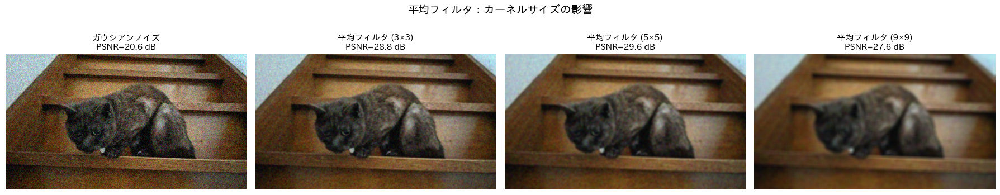

In [4]:
# 平均フィルタ：カーネルサイズの比較
kernel_sizes = [3, 5, 9]

blurred_mean = {k: cv2.blur(noisy_gaussian, (k, k)) for k in kernel_sizes}

fig, axes = plt.subplots(1, 4, figsize=(18, 4))

axes[0].imshow(noisy_gaussian)
axes[0].set_title(f"ガウシアンノイズ\nPSNR={psnr(img, noisy_gaussian):.1f} dB", fontsize=11)
axes[0].axis('off')

for ax, k in zip(axes[1:], kernel_sizes):
    result = blurred_mean[k]
    ax.imshow(result)
    ax.set_title(f"平均フィルタ ({k}×{k})\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("平均フィルタ：カーネルサイズの影響", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### ガウシアンフィルタ（Gaussian Filter）

カーネルの重みを **ガウス関数（正規分布）** に従って設定したフィルタ。中心画素に大きな重みを置き、周辺になるほど重みが小さくなる。単純平均より自然なぼかしが得られる。

:::{admonition} ガウシアンカーネル

$$
G(x, y) = \frac{1}{2\pi\sigma^2} \exp\!\left(-\frac{x^2 + y^2}{2\sigma^2}\right)
$$

- $\sigma$：ガウス分布の標準偏差。大きいほど広い範囲を平滑化する
- カーネルサイズ $k$ は通常 $k = 2\lceil 3\sigma \rceil + 1$ で自動決定される

OpenCV: `cv2.GaussianBlur(src, ksize, sigmaX)`

:::

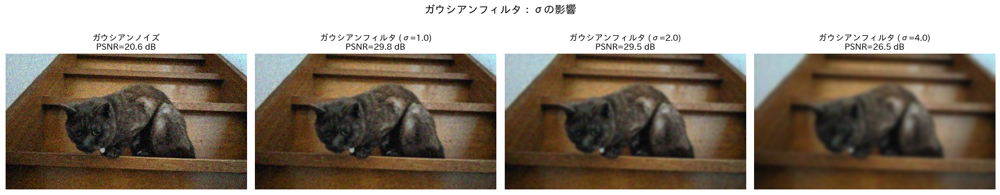

In [5]:
# ガウシアンフィルタ：σの比較
sigmas = [1.0, 2.0, 4.0]

blurred_gaussian_filter = {}
for s in sigmas:
    k = 2 * int(3 * s) + 1  # 3σ ルール
    k = max(k, 3) | 1       # 奇数かつ最小3
    blurred_gaussian_filter[s] = cv2.GaussianBlur(noisy_gaussian, (k, k), s)

fig, axes = plt.subplots(1, 4, figsize=(18, 4))

axes[0].imshow(noisy_gaussian)
axes[0].set_title(f"ガウシアンノイズ\nPSNR={psnr(img, noisy_gaussian):.1f} dB", fontsize=11)
axes[0].axis('off')

for ax, s in zip(axes[1:], sigmas):
    result = blurred_gaussian_filter[s]
    ax.imshow(result)
    ax.set_title(f"ガウシアンフィルタ (σ={s})\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("ガウシアンフィルタ：σの影響", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

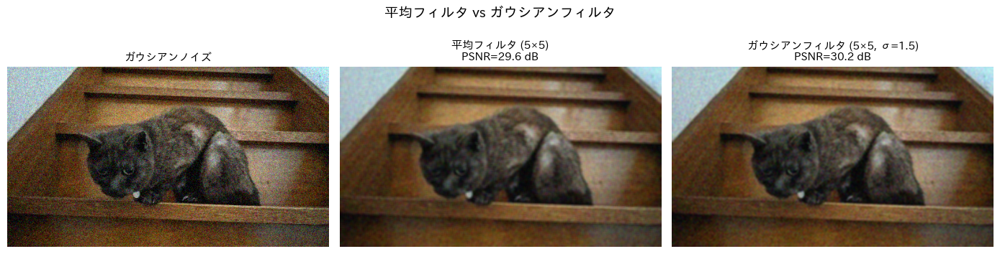

In [6]:
# 平均フィルタ vs ガウシアンフィルタ の比較（同等の平滑化強度で）
mean_5    = cv2.blur(noisy_gaussian, (5, 5))
gaussian_5 = cv2.GaussianBlur(noisy_gaussian, (5, 5), 1.5)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

data = [
    (noisy_gaussian, "ガウシアンノイズ"),
    (mean_5,          f"平均フィルタ (5×5)\nPSNR={psnr(img, mean_5):.1f} dB"),
    (gaussian_5,      f"ガウシアンフィルタ (5×5, σ=1.5)\nPSNR={psnr(img, gaussian_5):.1f} dB"),
]

for ax, (image, title) in zip(axes, data):
    ax.imshow(image)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

fig.suptitle("平均フィルタ vs ガウシアンフィルタ", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 3. 非線形フィルタ

**非線形フィルタ** は、近傍画素の統計量（中央値など）や画素値の類似度に基づいて出力を決めるフィルタ。計算コストは高いが、エッジを保ちながらノイズを除去できるものが多い。

### メディアンフィルタ（Median Filter）

カーネル内の全画素を並べ替えて **中央値（メジアン）** を出力する。外れ値（極端に白・黒なピクセル）を自動的に排除するため、ソルト＆ペッパーノイズに対して特に強い。

:::{admonition} メディアンフィルタの特徴

- 外れ値の影響を受けない（ロバスト統計）
- 平均フィルタより **エッジを保持しやすい**
- S&P ノイズ除去において平均・ガウシアンフィルタを大幅に上回る
- ただし、ガウシアンノイズには平均/ガウシアンフィルタの方が有効なことが多い

OpenCV: `cv2.medianBlur(src, ksize)`

:::

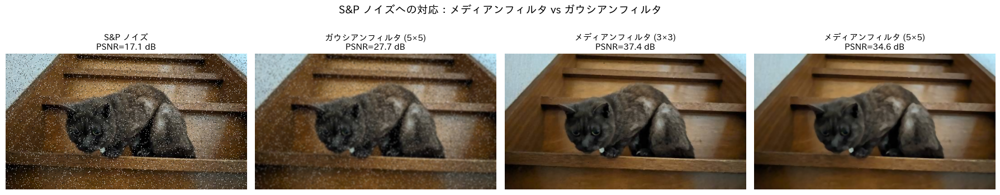

In [7]:
# S&P ノイズに対するメディアンフィルタの効果
median_3  = cv2.medianBlur(noisy_sp, 3)
median_5  = cv2.medianBlur(noisy_sp, 5)
gauss_sp  = cv2.GaussianBlur(noisy_sp, (5, 5), 1.5)   # ガウシアンとの比較

fig, axes = plt.subplots(1, 4, figsize=(18, 4))

data = [
    (noisy_sp,  f"S&P ノイズ\nPSNR={psnr(img, noisy_sp):.1f} dB"),
    (gauss_sp,  f"ガウシアンフィルタ (5×5)\nPSNR={psnr(img, gauss_sp):.1f} dB"),
    (median_3,  f"メディアンフィルタ (3×3)\nPSNR={psnr(img, median_3):.1f} dB"),
    (median_5,  f"メディアンフィルタ (5×5)\nPSNR={psnr(img, median_5):.1f} dB"),
]

for ax, (image, title) in zip(axes, data):
    ax.imshow(image)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

fig.suptitle("S&P ノイズへの対応：メディアンフィルタ vs ガウシアンフィルタ", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

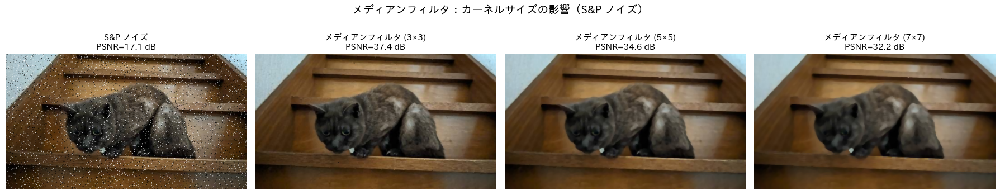

In [8]:
# メディアンフィルタのカーネルサイズ比較（S&P ノイズ）
ksizes = [3, 5, 7]
medians = {k: cv2.medianBlur(noisy_sp, k) for k in ksizes}

fig, axes = plt.subplots(1, 4, figsize=(18, 4))

axes[0].imshow(noisy_sp)
axes[0].set_title(f"S&P ノイズ\nPSNR={psnr(img, noisy_sp):.1f} dB", fontsize=11)
axes[0].axis('off')

for ax, k in zip(axes[1:], ksizes):
    result = medians[k]
    ax.imshow(result)
    ax.set_title(f"メディアンフィルタ ({k}×{k})\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("メディアンフィルタ：カーネルサイズの影響（S&P ノイズ）", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### バイラテラルフィルタ（Bilateral Filter）

ガウシアンフィルタの弱点である「エッジのぼけ」を解消するために開発されたフィルタ。空間的な近さだけでなく、**画素値の類似度** も重みに組み込む。

:::{admonition} バイラテラルフィルタ

$$
I_{\text{out}}(x, y) = \frac{1}{W} \sum_{(i,j) \in \mathcal{N}} I(i,j) \cdot G_s(\|\mathbf{p}-\mathbf{q}\|) \cdot G_r(|I(\mathbf{p})-I(\mathbf{q})|)
$$

- $G_s$：空間カーネル（距離が遠いほど重みが小さい）、パラメータ $\sigma_s$
- $G_r$：値域カーネル（画素値が違うほど重みが小さい）、パラメータ $\sigma_r$
- $W$：正規化定数

エッジ近傍では値域カーネルの重みが急落するため、エッジを越えた平滑化が抑制される。

OpenCV: `cv2.bilateralFilter(src, d, sigmaColor, sigmaSpace)`
- `d`：フィルタ径（-1 で sigmaSpace から自動計算）
- `sigmaColor`：色空間のσ（大きいほど色差が大きくても平均化）
- `sigmaSpace`：座標空間のσ

:::

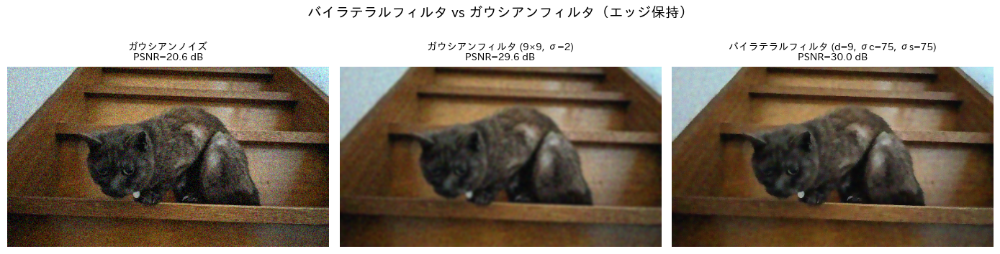

In [9]:
# バイラテラルフィルタ vs ガウシアンフィルタ：エッジ保持の比較
gaussian_blur = cv2.GaussianBlur(noisy_gaussian, (9, 9), 2.0)
bilateral     = cv2.bilateralFilter(noisy_gaussian, d=9, sigmaColor=75, sigmaSpace=75)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))

data = [
    (noisy_gaussian, f"ガウシアンノイズ\nPSNR={psnr(img, noisy_gaussian):.1f} dB"),
    (gaussian_blur,  f"ガウシアンフィルタ (9×9, σ=2)\nPSNR={psnr(img, gaussian_blur):.1f} dB"),
    (bilateral,      f"バイラテラルフィルタ (d=9, σc=75, σs=75)\nPSNR={psnr(img, bilateral):.1f} dB"),
]

for ax, (image, title) in zip(axes, data):
    ax.imshow(image)
    ax.set_title(title, fontsize=10)
    ax.axis('off')

fig.suptitle("バイラテラルフィルタ vs ガウシアンフィルタ（エッジ保持）", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

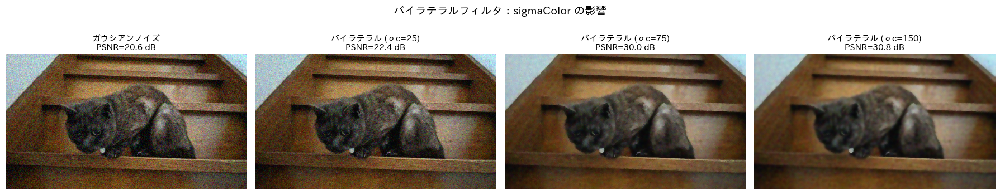

In [10]:
# バイラテラルフィルタ：sigmaColor の影響
sigma_colors = [25, 75, 150]
bilaterals = {
    sc: cv2.bilateralFilter(noisy_gaussian, d=9, sigmaColor=sc, sigmaSpace=75)
    for sc in sigma_colors
}

fig, axes = plt.subplots(1, 4, figsize=(18, 4))

axes[0].imshow(noisy_gaussian)
axes[0].set_title(f"ガウシアンノイズ\nPSNR={psnr(img, noisy_gaussian):.1f} dB", fontsize=11)
axes[0].axis('off')

for ax, sc in zip(axes[1:], sigma_colors):
    result = bilaterals[sc]
    ax.imshow(result)
    ax.set_title(f"バイラテラル (σc={sc})\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("バイラテラルフィルタ：sigmaColor の影響", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Non-Local Means（NLM）

「画像内の類似したパッチ（局所領域）は同じ信号から生成されている」という仮定に基づく手法。注目画素の近傍だけでなく、**画像全体から類似パッチを探して** 重み付き平均を取る。

:::{admonition} Non-Local Means の原理

$$
\text{NLM}(I)(\mathbf{p}) = \frac{1}{C(\mathbf{p})} \sum_{\mathbf{q} \in \Omega} w(\mathbf{p}, \mathbf{q}) \cdot I(\mathbf{q})
$$

重みは近傍パッチの類似度から計算する：

$$
w(\mathbf{p}, \mathbf{q}) = \exp\!\left(-\frac{\| P(\mathbf{p}) - P(\mathbf{q}) \|^2}{h^2}\right)
$$

- $P(\mathbf{p})$：画素 $\mathbf{p}$ を中心とするパッチ（小領域）
- $h$：ノイズレベルに対応するフィルタリング強度パラメータ
- $\Omega$：探索窓（search window）

局所フィルタより高品質だが、計算コストが高い（OpenCVでは高速実装を提供）。

OpenCV: `cv2.fastNlMeansDenoisingColored(src, None, h, hForColorComponents, templateWindowSize, searchWindowSize)`
- `h`：輝度成分のフィルタ強度（10 が典型値）
- `hForColorComponents`：色成分のフィルタ強度
- `templateWindowSize`：パッチサイズ（奇数、推奨 7）
- `searchWindowSize`：探索窓サイズ（奇数、推奨 21）

:::

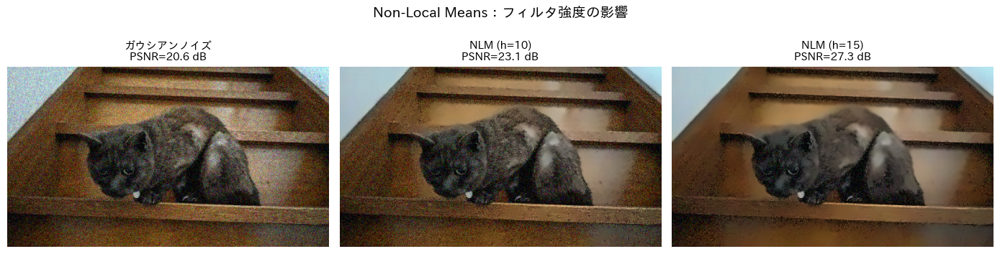

In [25]:
# Non-Local Means：フィルタ強度の比較
# ※ fastNlMeansDenoisingColored はカラー画像用
nlm_h10 = cv2.fastNlMeansDenoisingColored(noisy_gaussian, None,
                                           h=10, hColor=10,
                                           templateWindowSize=7,
                                           searchWindowSize=21)
nlm_h15 = cv2.fastNlMeansDenoisingColored(noisy_gaussian, None,
                                           h=15, hColor=15,
                                           templateWindowSize=7,
                                           searchWindowSize=21)


# 可視化
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

data = [
    (noisy_gaussian, f"ガウシアンノイズ\nPSNR={psnr(img, noisy_gaussian):.1f} dB"),
    (nlm_h10,        f"NLM (h=10)\nPSNR={psnr(img, nlm_h10):.1f} dB"),
    (nlm_h15,        f"NLM (h=15)\nPSNR={psnr(img, nlm_h15):.1f} dB"),
]

for ax, (image, title) in zip(axes, data):
    ax.imshow(image)
    ax.set_title(title, fontsize=11)
    ax.axis('off')

fig.suptitle("Non-Local Means：フィルタ強度の影響", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## まとめ：全手法の比較

各ノイズに対してすべてのフィルタを適用し、PSNR で定量比較する。

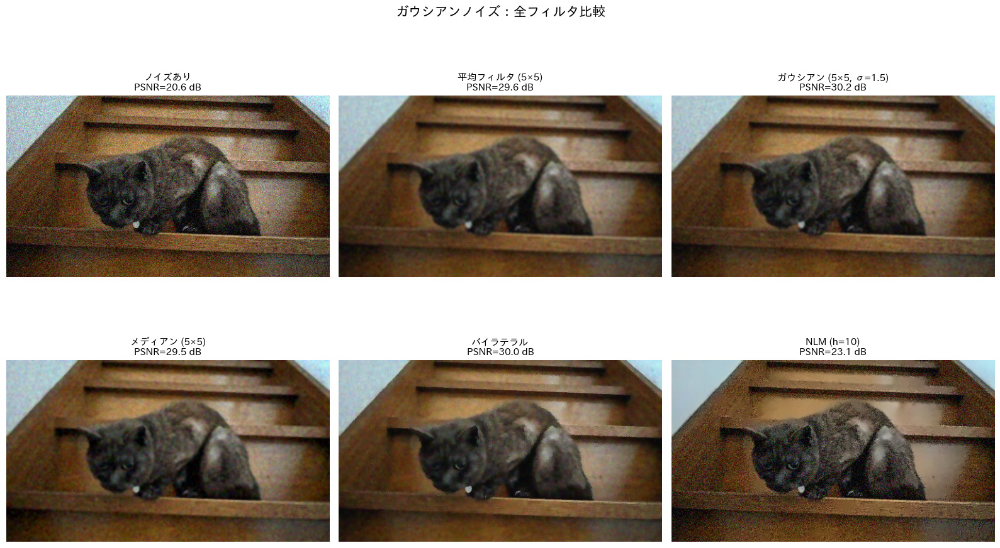

In [29]:
# ガウシアンノイズに対する全フィルタの比較
results_gaussian = {
    "ノイズあり":               noisy_gaussian,
    "平均フィルタ (5×5)":       cv2.blur(noisy_gaussian, (5, 5)),
    "ガウシアン (5×5, σ=1.5)": cv2.GaussianBlur(noisy_gaussian, (5, 5), 1.5),
    "メディアン (5×5)":         cv2.medianBlur(noisy_gaussian, 5),
    "バイラテラル":              cv2.bilateralFilter(noisy_gaussian, 9, 75, 75),
    "NLM (h=10)":               nlm_h10,
}


# ガウシアンノイズ：全手法の視覚比較グリッド
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for ax, (name, result) in zip(axes, results_gaussian.items()):
    ax.imshow(result)
    ax.set_title(f"{name}\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("ガウシアンノイズ：全フィルタ比較", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

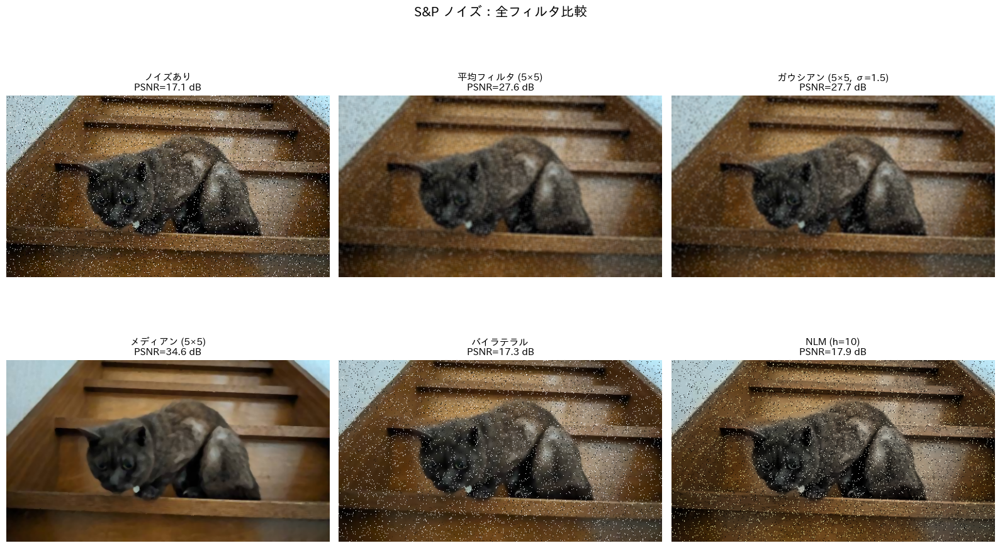

In [30]:
# S&P ノイズに対する全フィルタの比較
results_sp = {
    "ノイズあり":               noisy_sp,
    "平均フィルタ (5×5)":       cv2.blur(noisy_sp, (5, 5)),
    "ガウシアン (5×5, σ=1.5)": cv2.GaussianBlur(noisy_sp, (5, 5), 1.5),
    "メディアン (5×5)":         cv2.medianBlur(noisy_sp, 5),
    "バイラテラル":              cv2.bilateralFilter(noisy_sp, 9, 75, 75),
    "NLM (h=10)": cv2.fastNlMeansDenoisingColored(noisy_sp, None, 10, 10, 7, 21),
}


# S&P ノイズ：全手法の視覚比較グリッド
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for ax, (name, result) in zip(axes, results_sp.items()):
    ax.imshow(result)
    ax.set_title(f"{name}\nPSNR={psnr(img, result):.1f} dB", fontsize=11)
    ax.axis('off')

fig.suptitle("S&P ノイズ：全フィルタ比較", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

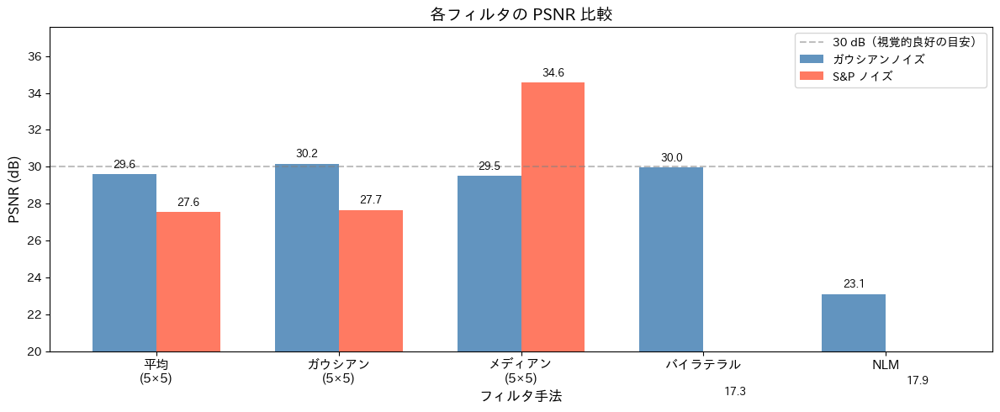

In [31]:
# PSNR 棒グラフで定量比較
methods = ["平均\n(5×5)", "ガウシアン\n(5×5)", "メディアン\n(5×5)", "バイラテラル", "NLM"]

psnr_gaussian = [
    psnr(img, cv2.blur(noisy_gaussian, (5, 5))),
    psnr(img, cv2.GaussianBlur(noisy_gaussian, (5, 5), 1.5)),
    psnr(img, cv2.medianBlur(noisy_gaussian, 5)),
    psnr(img, cv2.bilateralFilter(noisy_gaussian, 9, 75, 75)),
    psnr(img, nlm_h10),
]

nlm_sp = cv2.fastNlMeansDenoisingColored(noisy_sp, None, 10, 10, 7, 21)
psnr_sp = [
    psnr(img, cv2.blur(noisy_sp, (5, 5))),
    psnr(img, cv2.GaussianBlur(noisy_sp, (5, 5), 1.5)),
    psnr(img, cv2.medianBlur(noisy_sp, 5)),
    psnr(img, cv2.bilateralFilter(noisy_sp, 9, 75, 75)),
    psnr(img, nlm_sp),
]

x = np.arange(len(methods))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 5))
bars1 = ax.bar(x - width/2, psnr_gaussian, width, label='ガウシアンノイズ', color='steelblue', alpha=0.85)
bars2 = ax.bar(x + width/2, psnr_sp,       width, label='S&P ノイズ',       color='tomato',    alpha=0.85)

ax.set_xlabel('フィルタ手法', fontsize=12)
ax.set_ylabel('PSNR (dB)', fontsize=12)
ax.set_title('各フィルタの PSNR 比較', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(methods, fontsize=11)
ax.legend(fontsize=11)
ax.set_ylim(20, max(max(psnr_gaussian), max(psnr_sp)) + 3)

# 値ラベル
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9)
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9)

ax.axhline(y=30, color='gray', linestyle='--', alpha=0.5, label='30 dB（視覚的良好の目安）')
ax.legend(fontsize=10)
plt.tight_layout()
plt.show()

## 各手法のまとめ

| 手法 | 計算コスト | エッジ保持 | ガウシアン | S&P | 特徴 |
|------|-----------|-----------|-----------|-----|------|
| 平均フィルタ | 低 | 弱い | △ | △ | 最もシンプル |
| ガウシアンフィルタ | 低 | 弱い | ○ | △ | 自然なぼかし |
| メディアンフィルタ | 中 | 中程度 | △ | ◎ | S&P に最強 |
| バイラテラルフィルタ | 高 | 強い | ○ | △ | エッジを保ちながら平滑化 |
| Non-Local Means | 非常に高 | 強い | ◎ | ○ | 最高品質（遅い） |

:::{admonition} 手法の選び方

- **ガウシアンノイズを素早く除去したい** → ガウシアンフィルタ（σ を調整）
- **ソルト＆ペッパーノイズを除去したい** → メディアンフィルタ（カーネル 3〜5）
- **エッジを保ちながら平滑化したい** → バイラテラルフィルタ
- **最高品質のノイズ除去が必要（処理時間を許容できる）** → Non-Local Means

:::